# DPOAE Growth Function fitting Toolkit Notebook
This notebook mirrors the logic in `extract_DPOAE_fixed_togithub.py`, covering data discovery, cleaning, fitting, and plotting for Otodynamics Echoport 292 exports. Run the code cell below to execute the workflow.

IDs in the list:
['0089', '0232', '0331', '0802', '1095', '1758', '1865', '2058', '2485', '3085', '3675', '3740', '3820', '3985', '4554', '4706', '4984', '5156', '5301', '5444', '6097', '6208', '6236', '6421', '6626', '6632', '7234', '7266', '7789', '7857', '7942', '8045', '8051', '8248', '8575', '9138', '9287', '9862']
ID: 3820, side: L, indices: [0, 1], f_signature: (1414, 1414, 1414)
ID: 3820, side: R, indices: [3, 4], f_signature: (1414, 1414, 1414)
ID: 4706, side: L, indices: [1, 2], f_signature: (4243, 4243, 4243)
ID: 5156, side: L, indices: [0, 1], f_signature: (1414, 1414, 1414)
ID: 5156, side: R, indices: [3, 4], f_signature: (1414, 1414, 1414)
ID: 7266, side: L, indices: [0, 1], f_signature: (4243, 4243, 4243)
ID: 7266, side: R, indices: [2, 6, 7], f_signature: (1414, 1414, 1414)
ID: 7266, side: L, indices: [4, 5], f_signature: (1414, 1414, 1414)
ID: 8248, side: L, indices: [0, 1], f_signature: (1414, 1414, 1414)
ID: 8248, side: R, indices: [3, 4], f_signature: (1414, 1414, 1

C:\Users\Leny\AppData\Local\Temp\ipykernel_89500\2510931838.py:375: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=((15/2)*len(OAE['DP']), 5))


mean R^2 25-45:0.9329698655977828
mean R^2 25-50:0.9372533162557855
mean R^2 25-55:0.9323221898419296


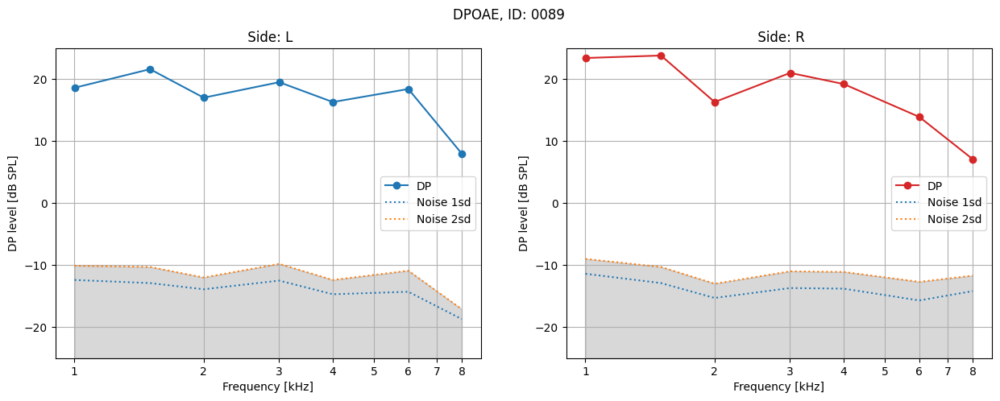

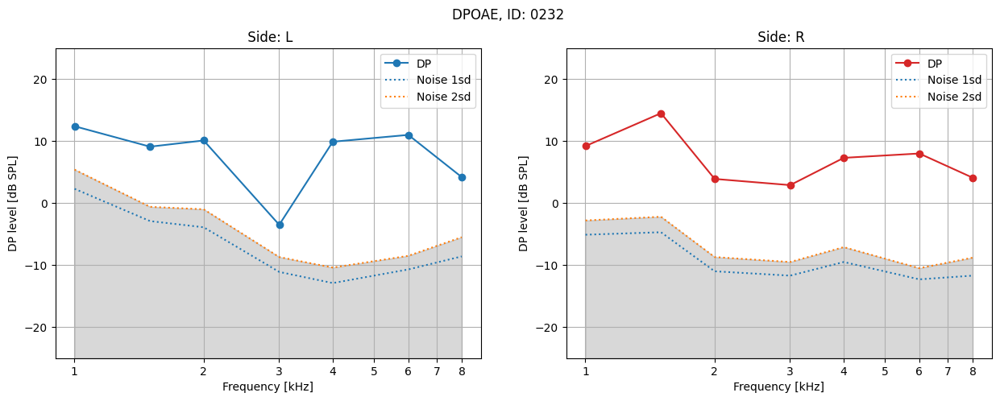

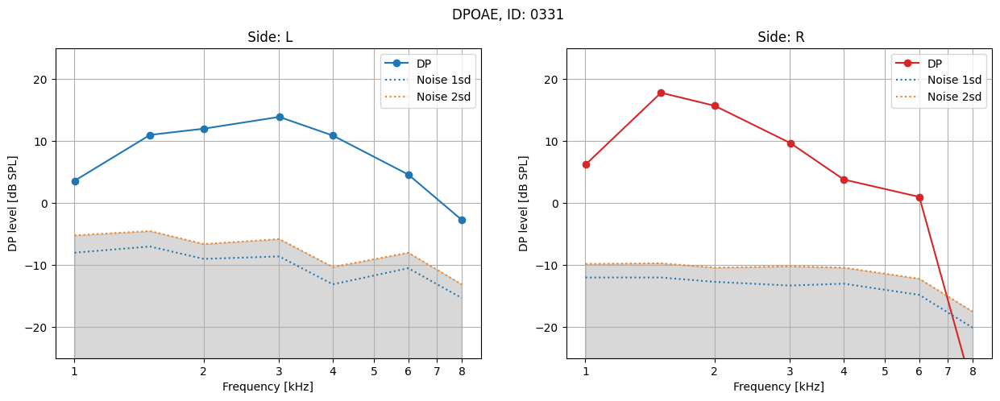

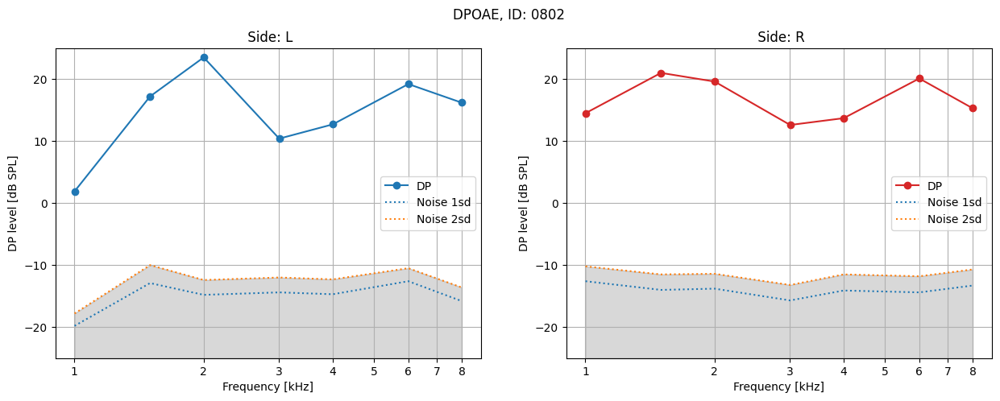

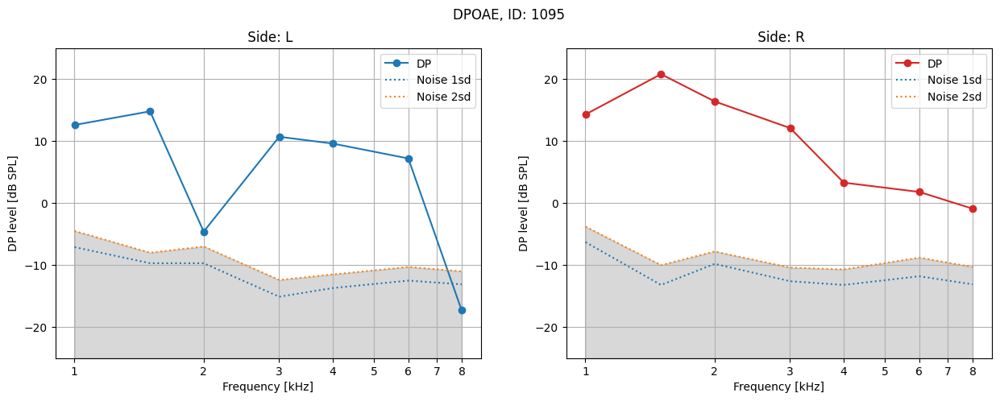

...

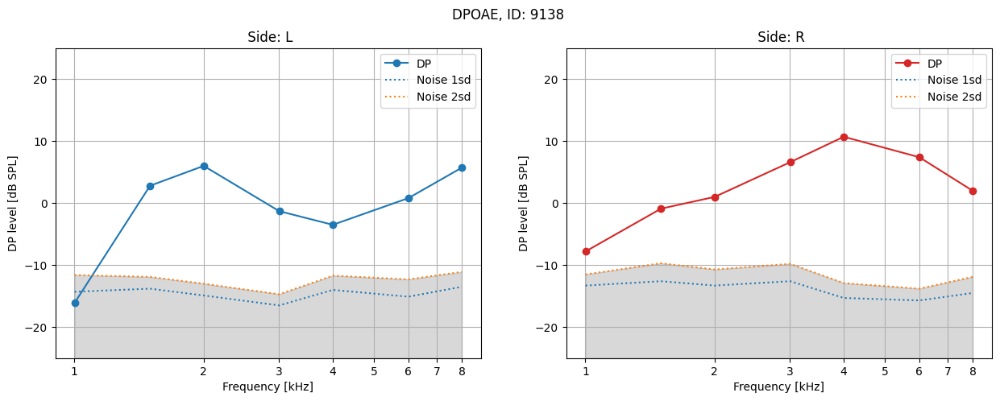

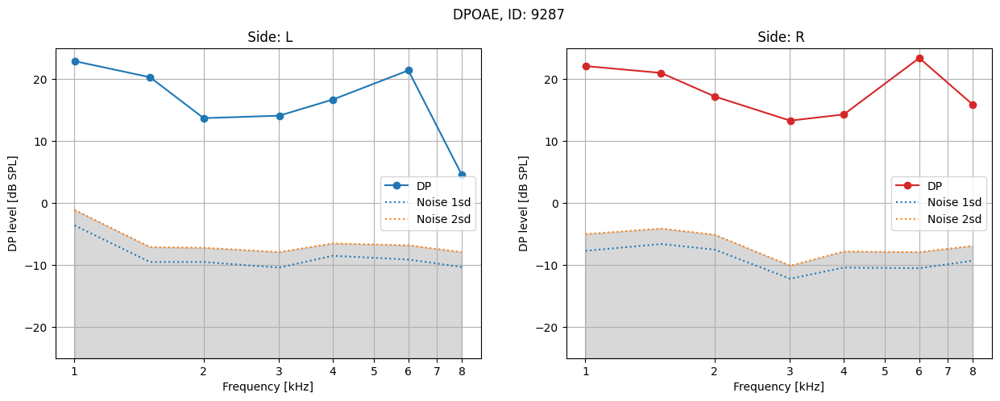

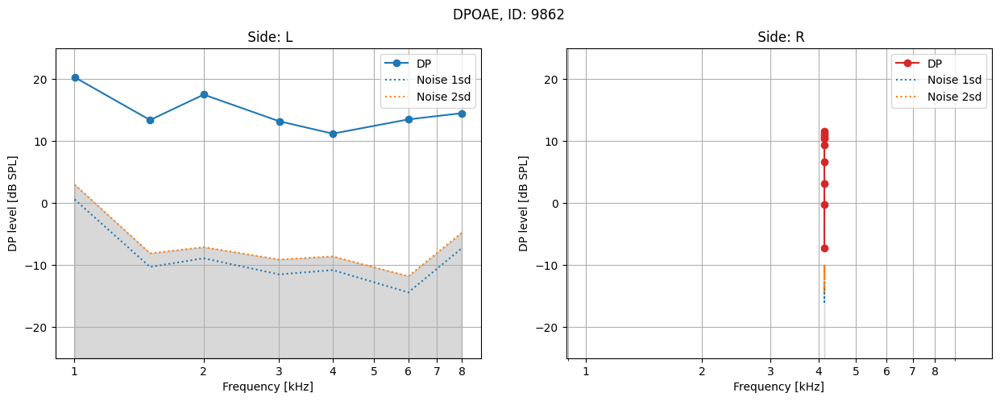

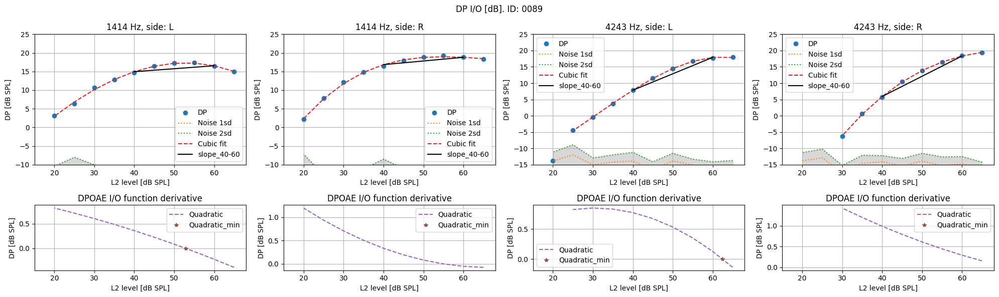

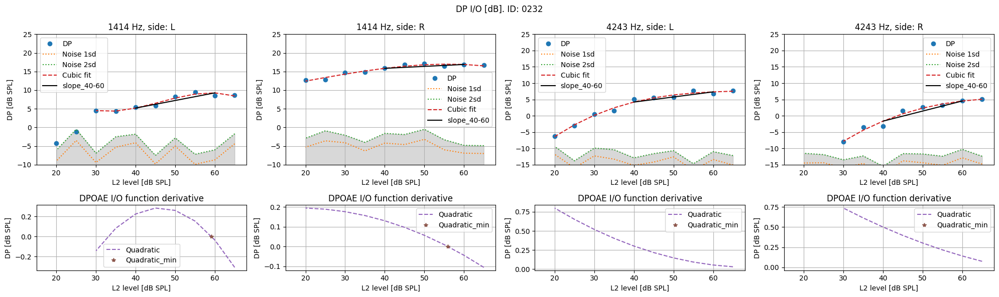

missing cubic fit for 0331
missing quadratic fit for 0331


C:\Users\Leny\AppData\Local\Temp\ipykernel_89500\2510931838.py:667: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1, n_sub].legend()


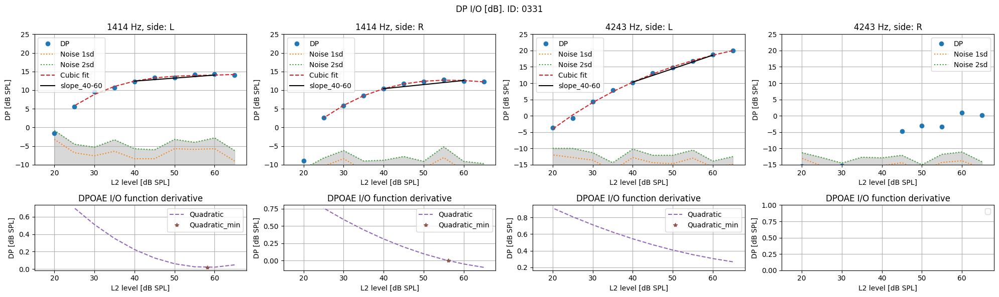

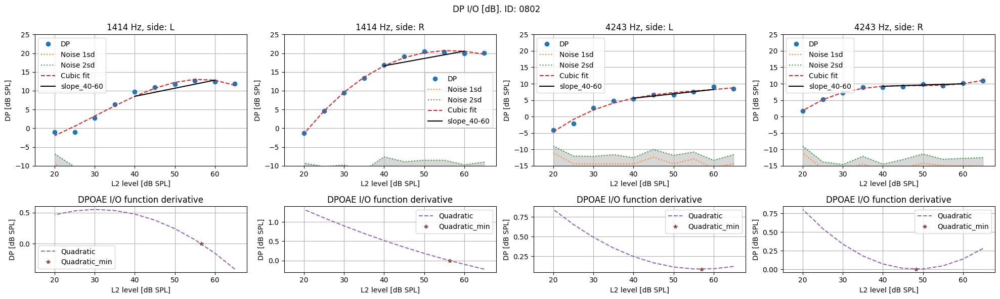

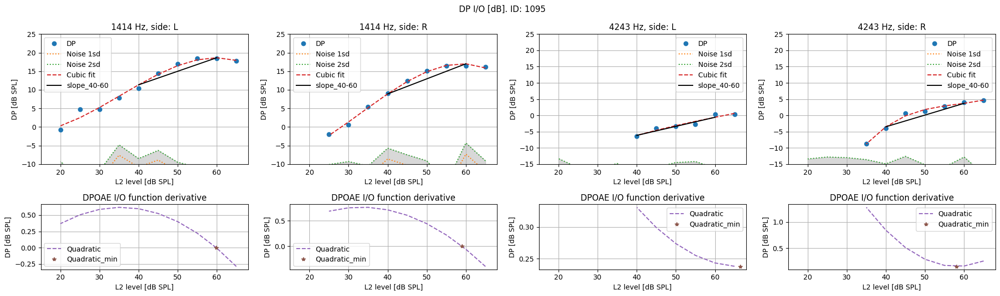

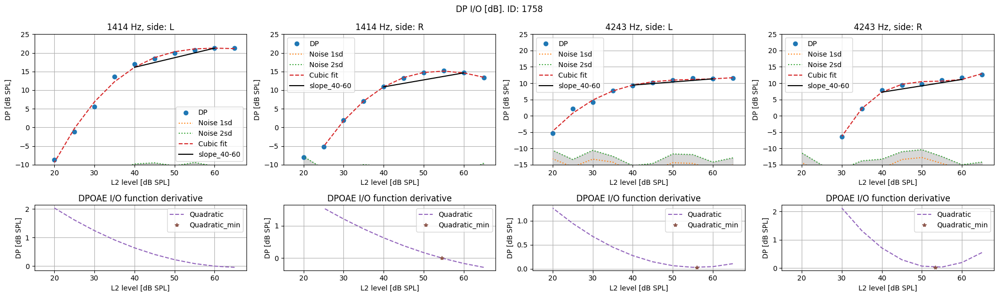

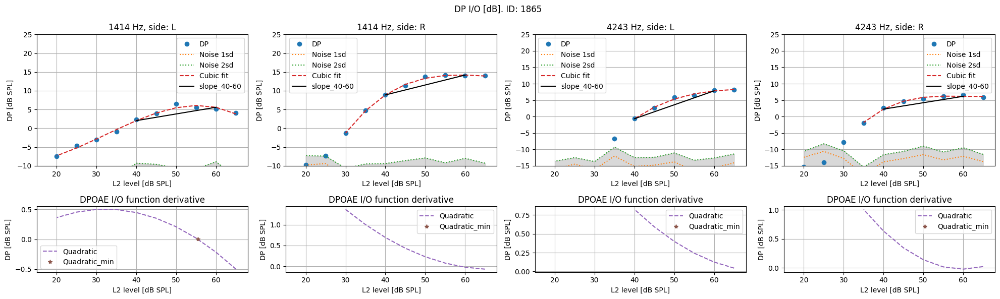

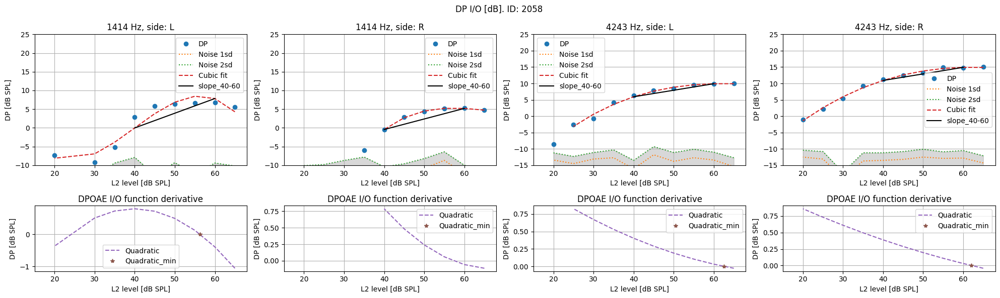

missing cubic fit for 2485
missing quadratic fit for 2485


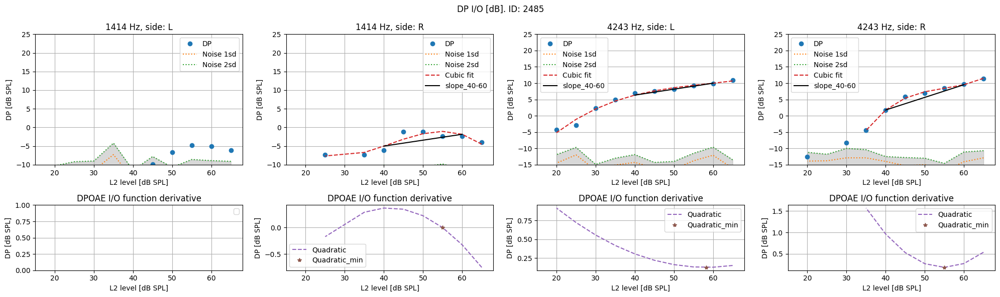

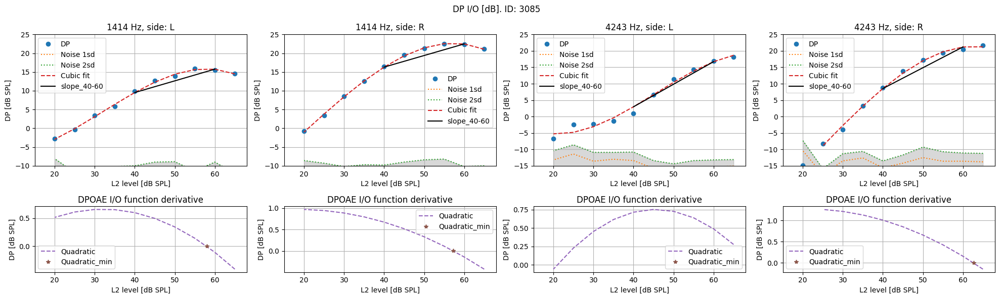

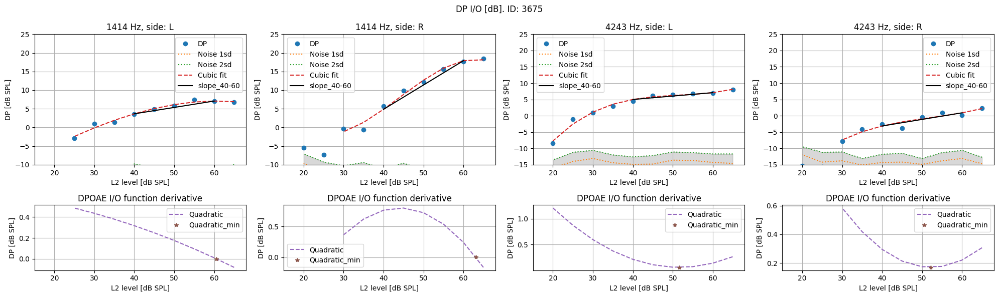

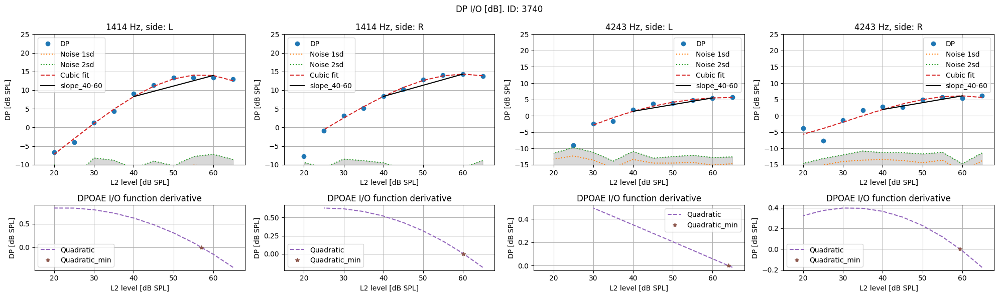

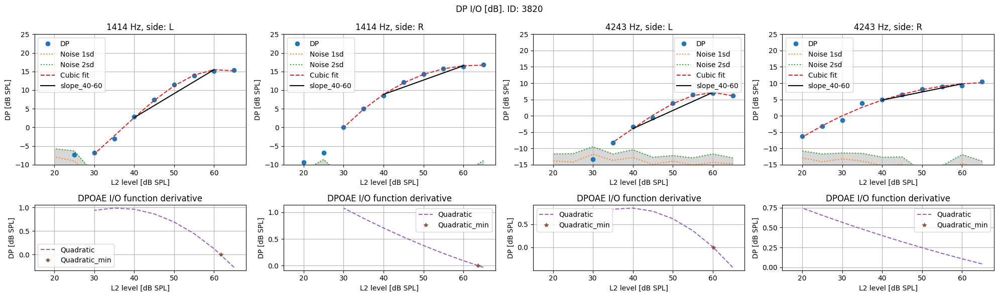

missing cubic fit for 3985
missing quadratic fit for 3985
missing cubic fit for 3985
missing quadratic fit for 3985


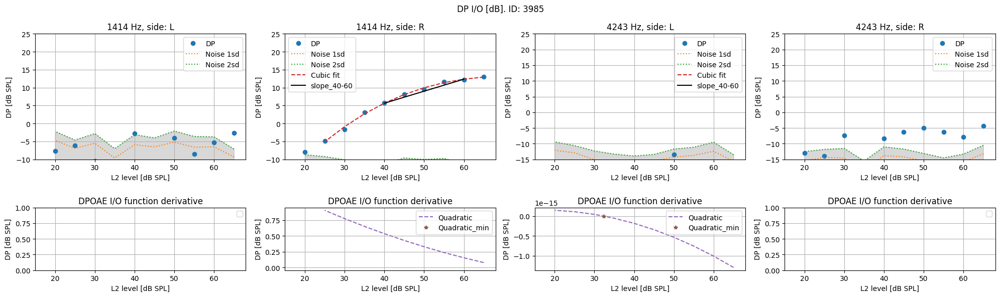

missing cubic fit for 4554
missing quadratic fit for 4554
missing cubic fit for 4554
missing quadratic fit for 4554


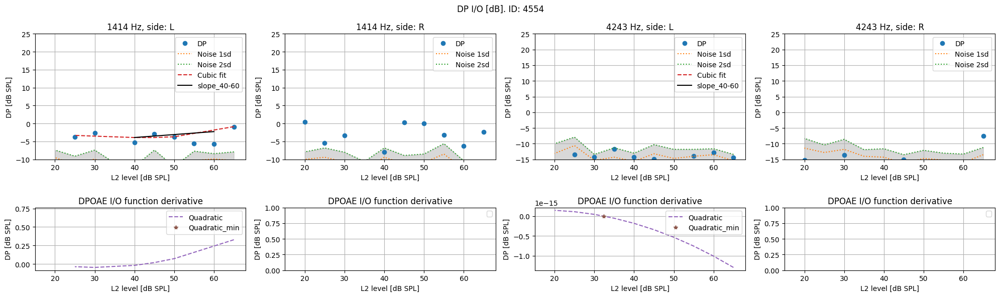

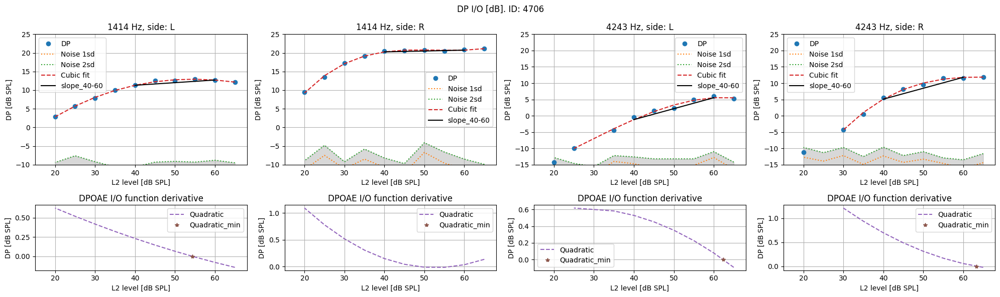

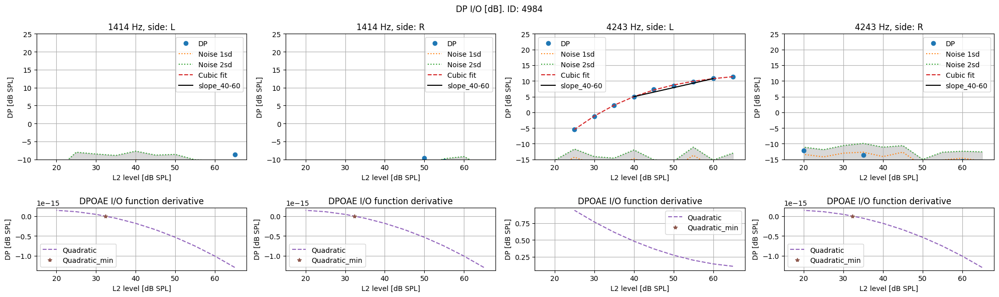

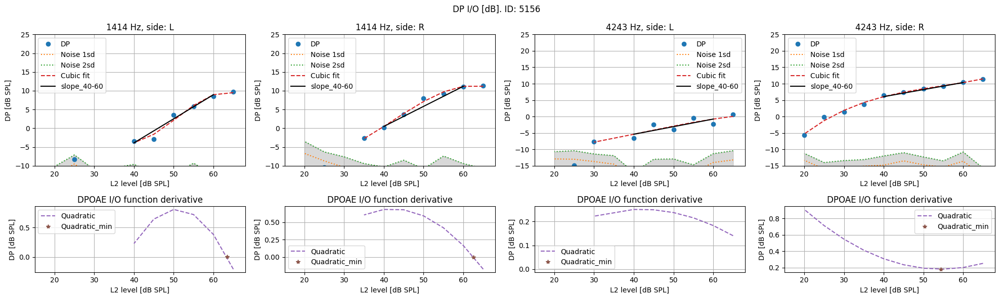

missing cubic fit for 5301
missing quadratic fit for 5301
missing cubic fit for 5301
missing quadratic fit for 5301
missing cubic fit for 5301
missing quadratic fit for 5301


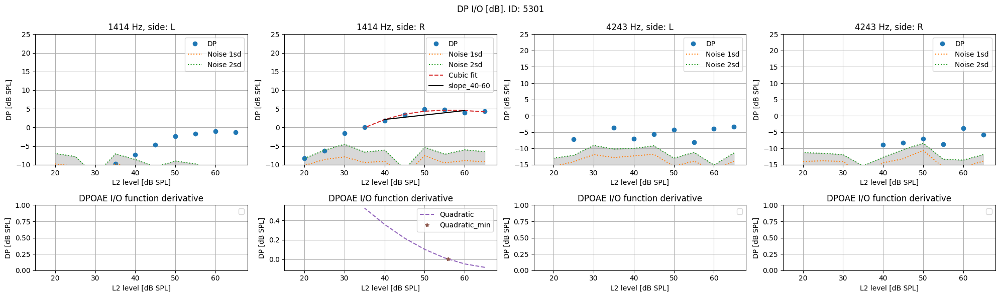

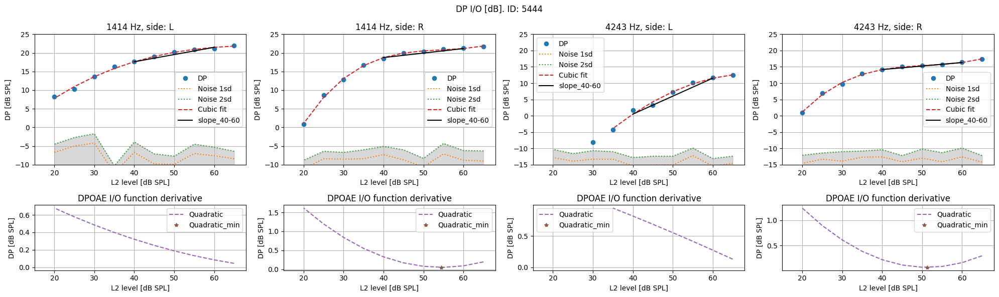

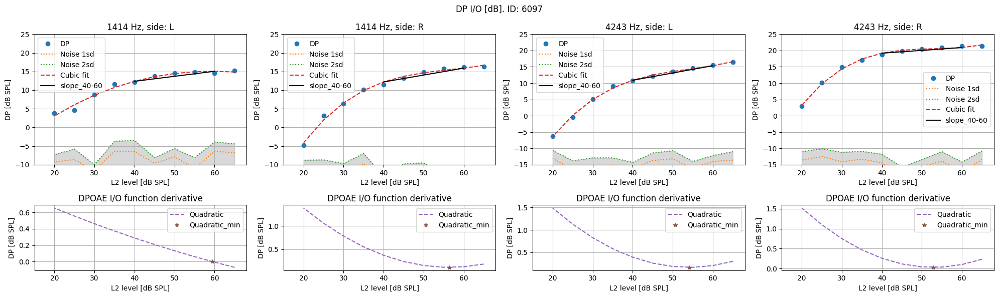

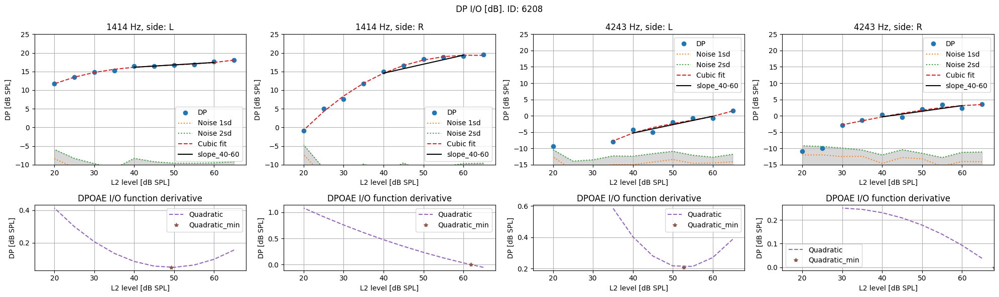

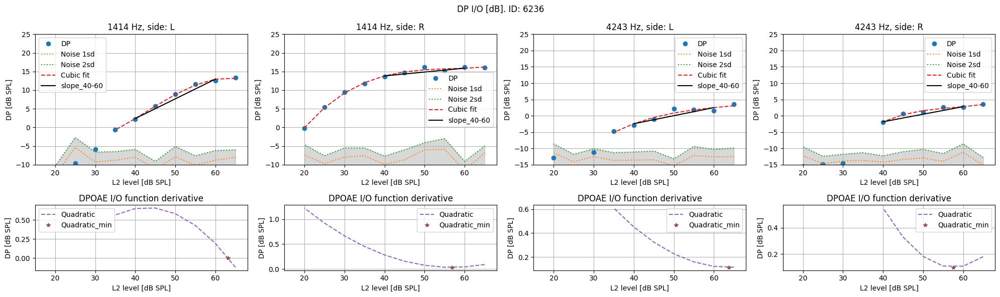

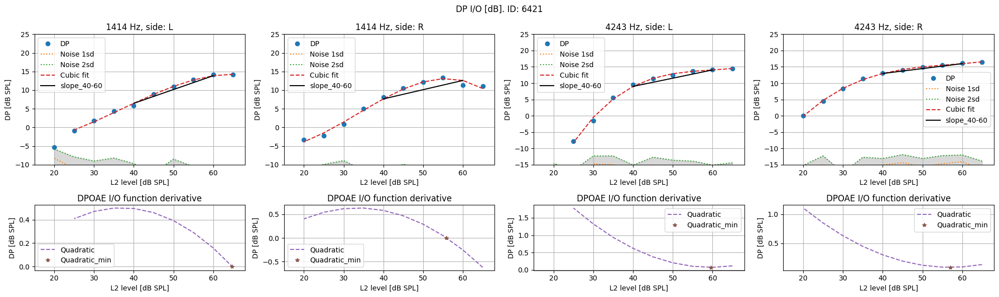

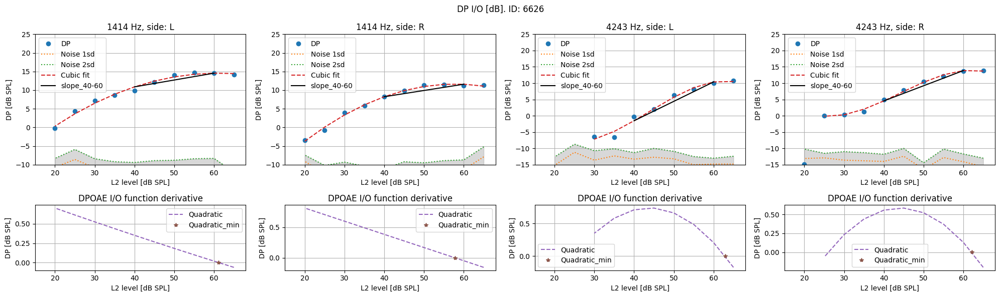

missing cubic fit for 6632
missing quadratic fit for 6632


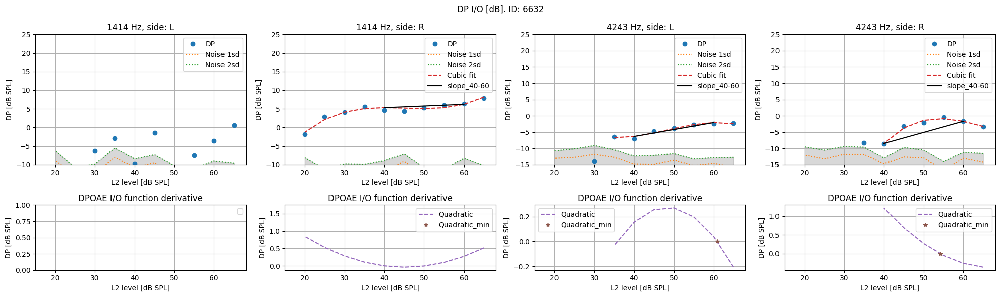

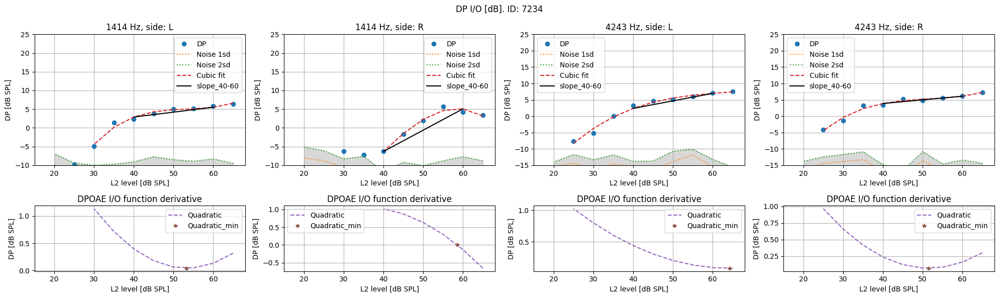

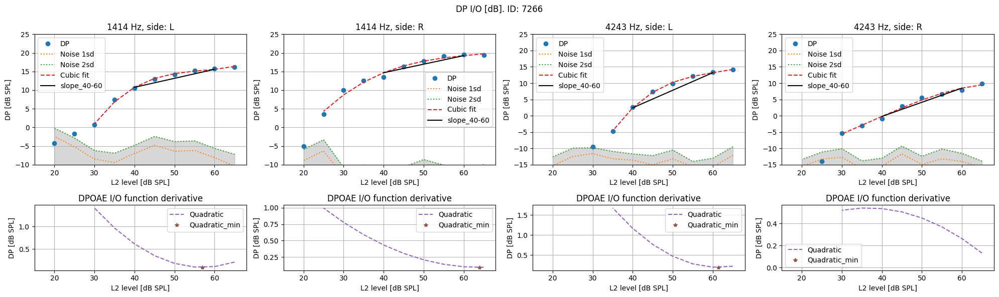

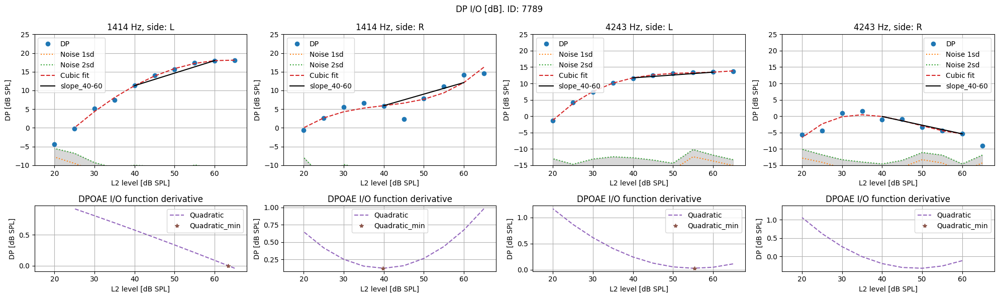

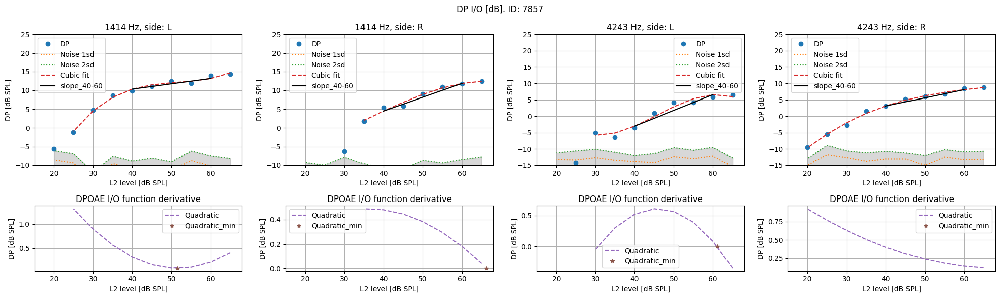

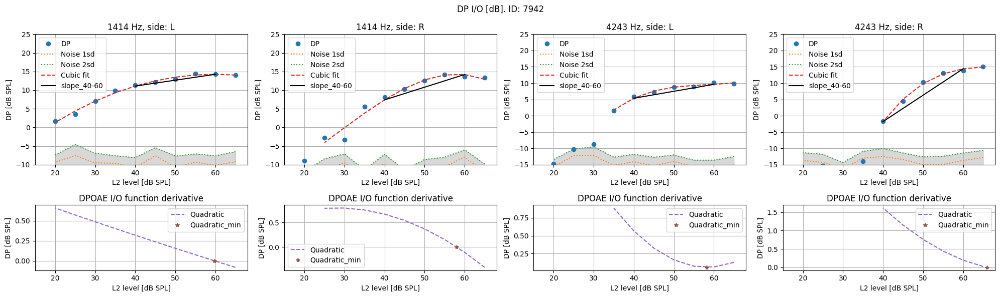

missing quadratic fit for 8045


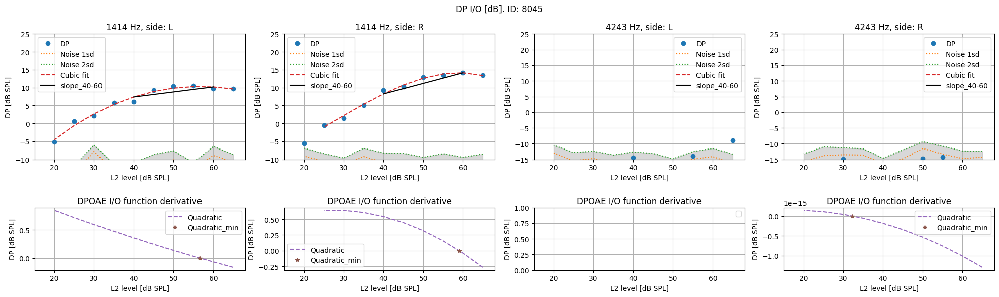

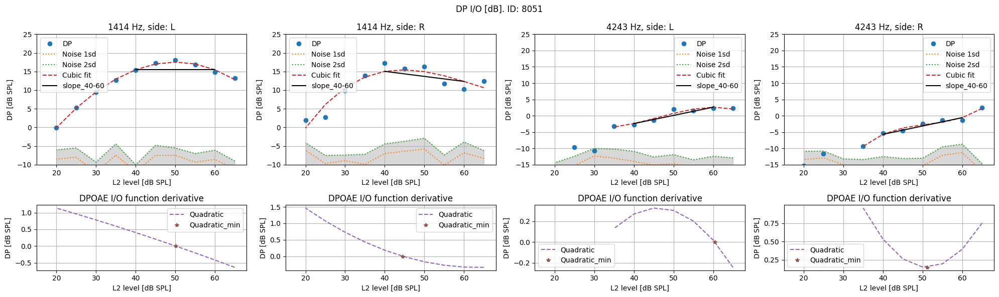

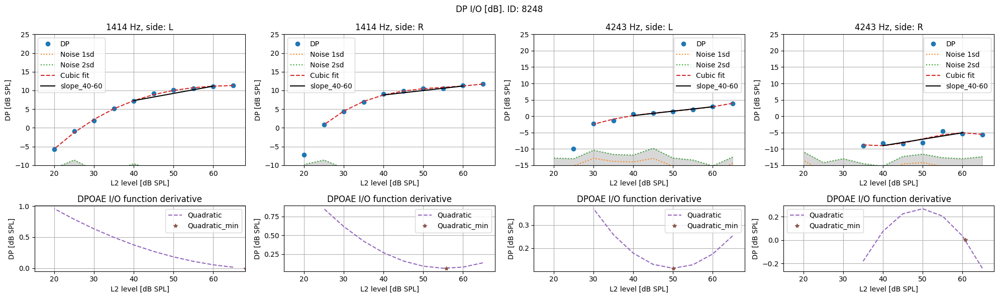

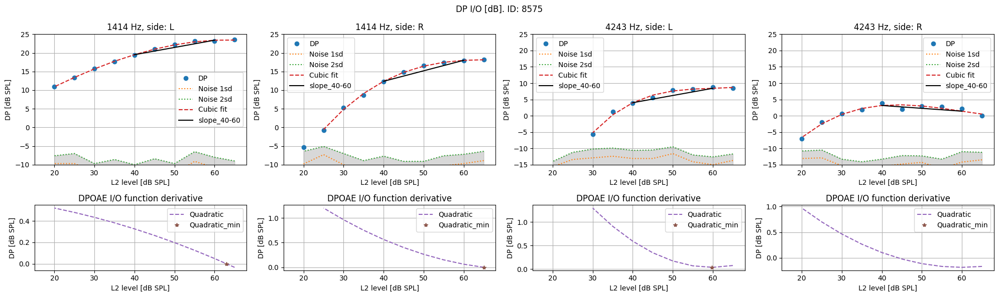

missing cubic fit for 9138
missing quadratic fit for 9138
missing cubic fit for 9138
missing quadratic fit for 9138
missing cubic fit for 9138
missing quadratic fit for 9138


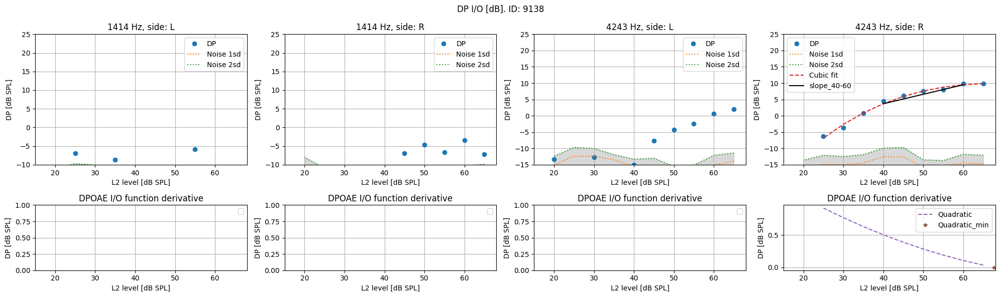

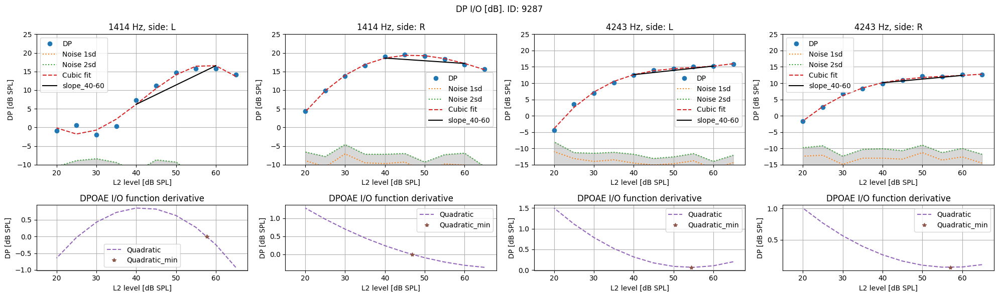

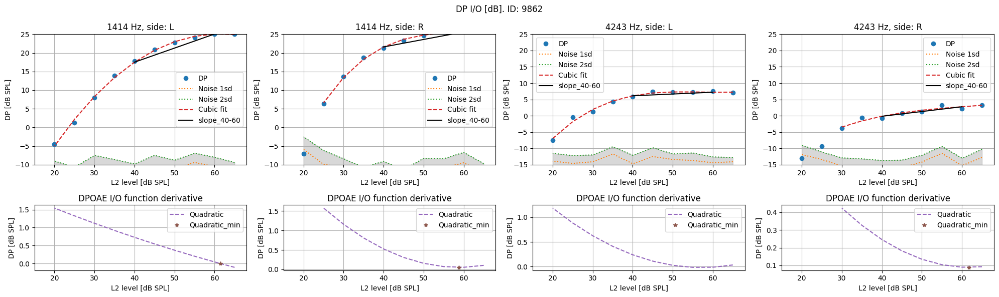

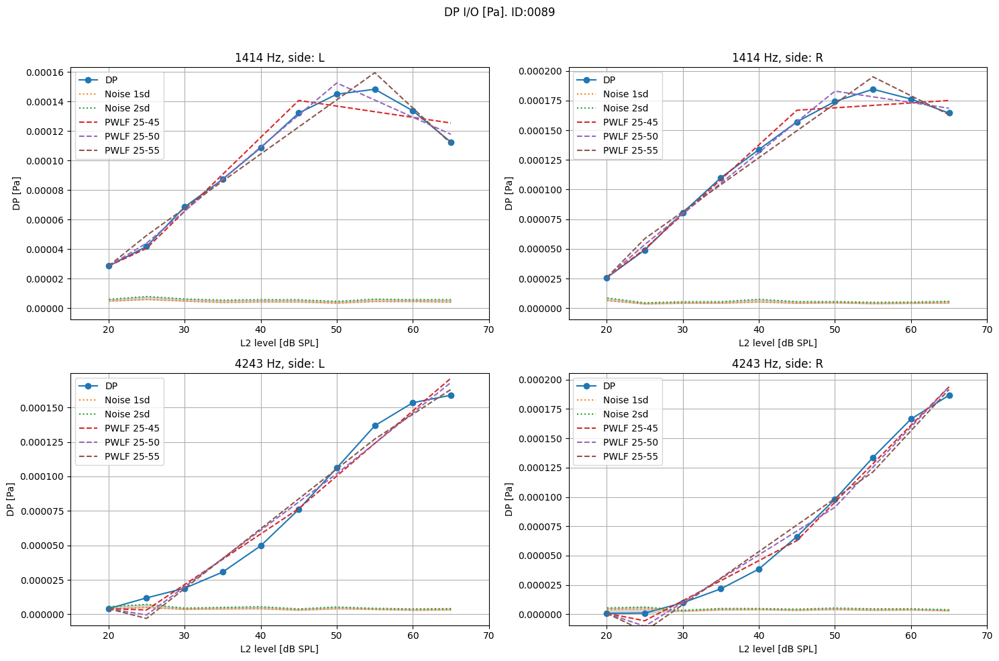

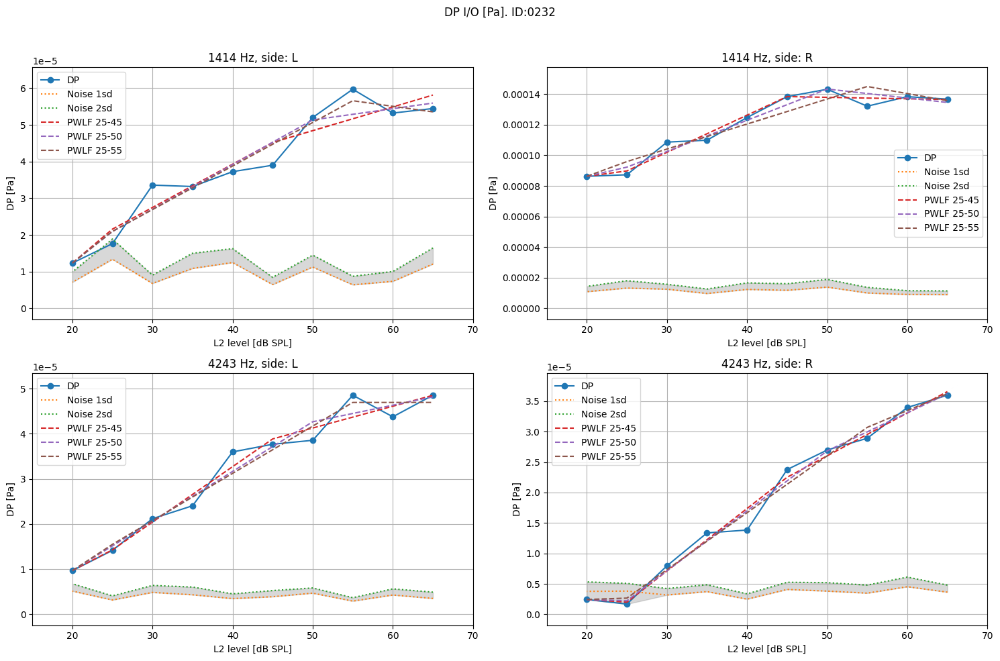

...

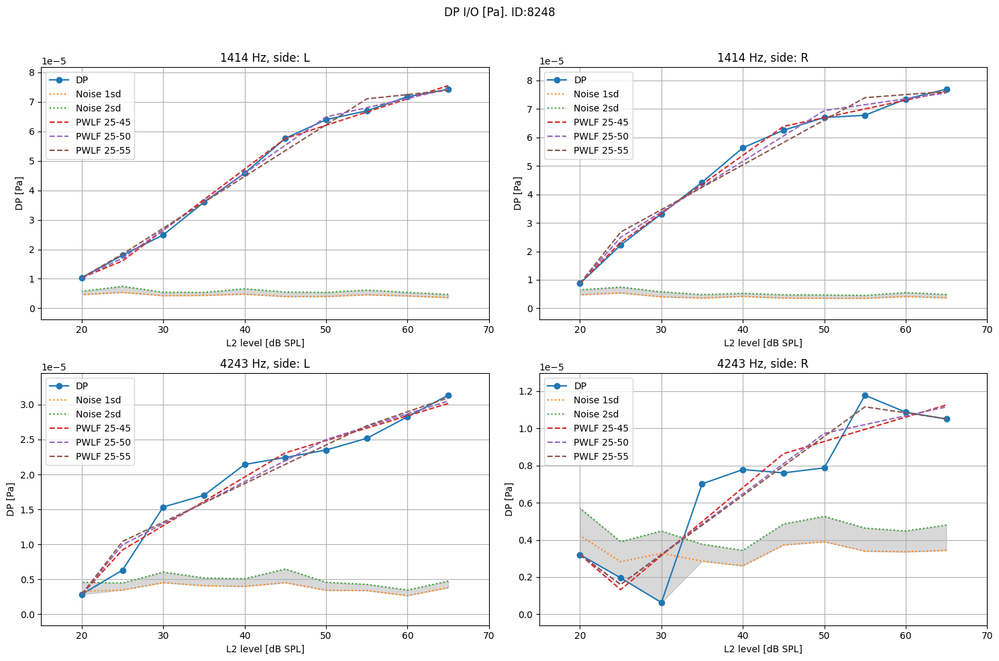

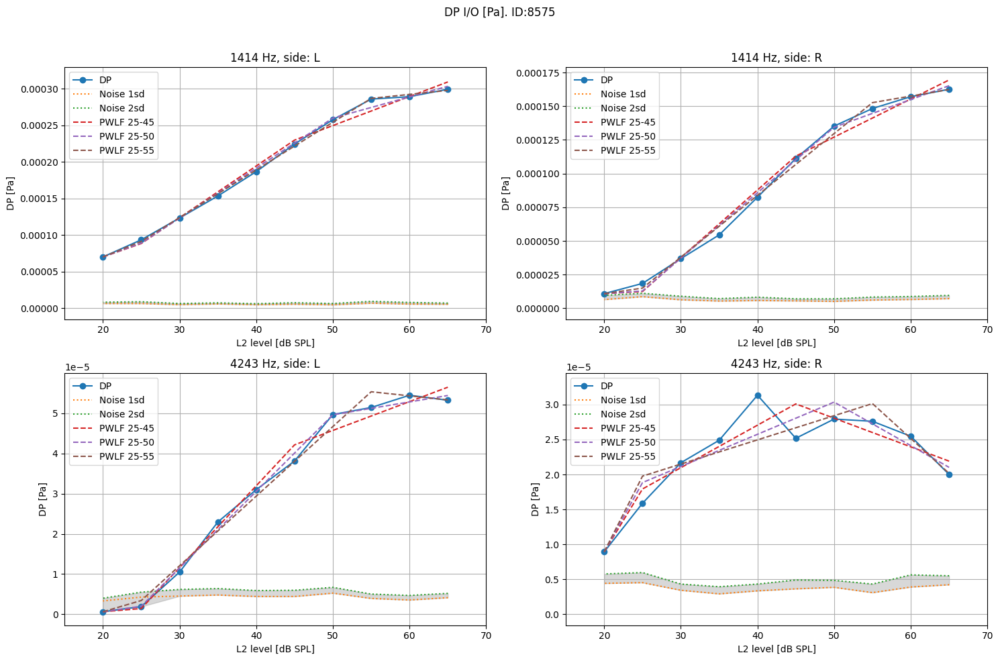

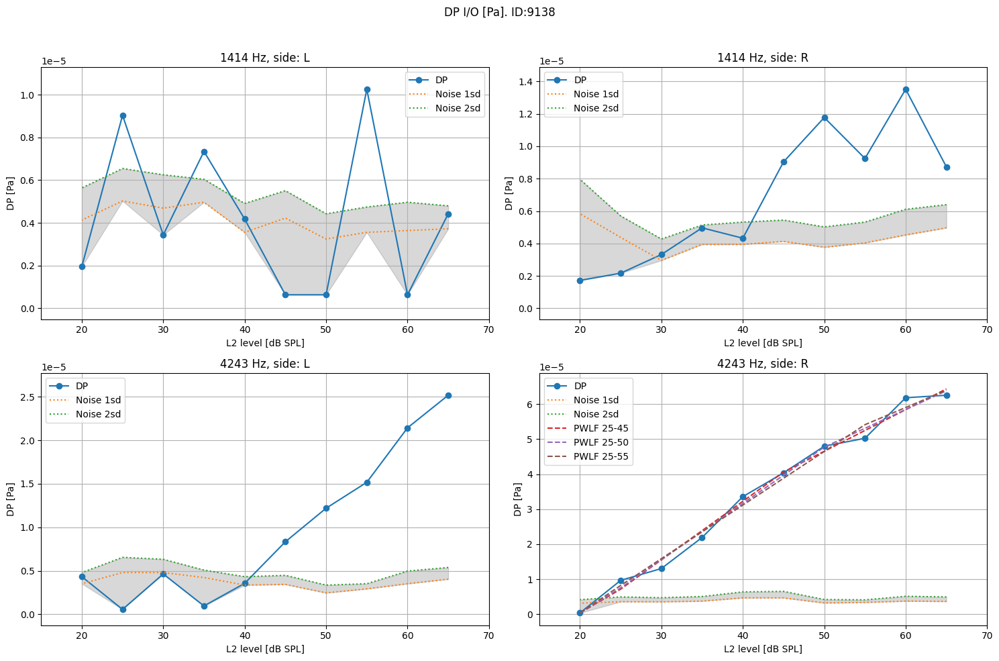

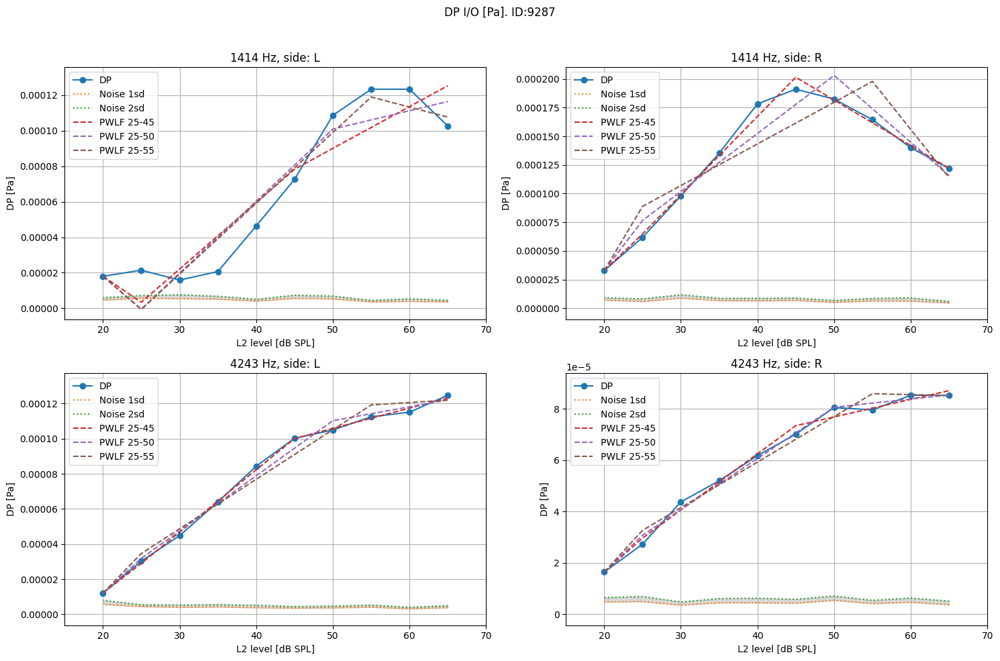

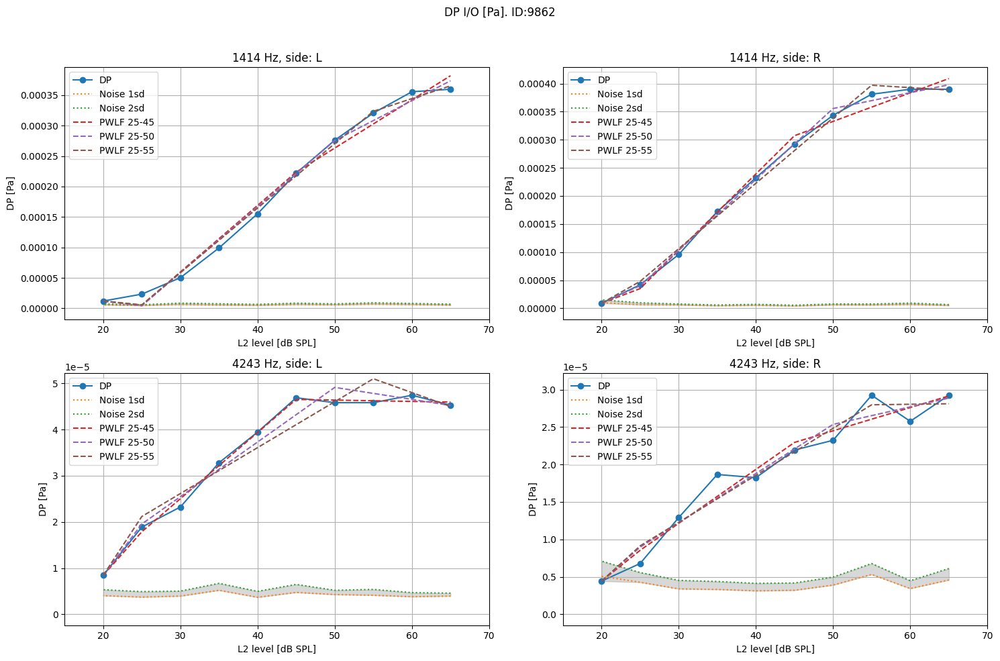

IndexError: list index out of range

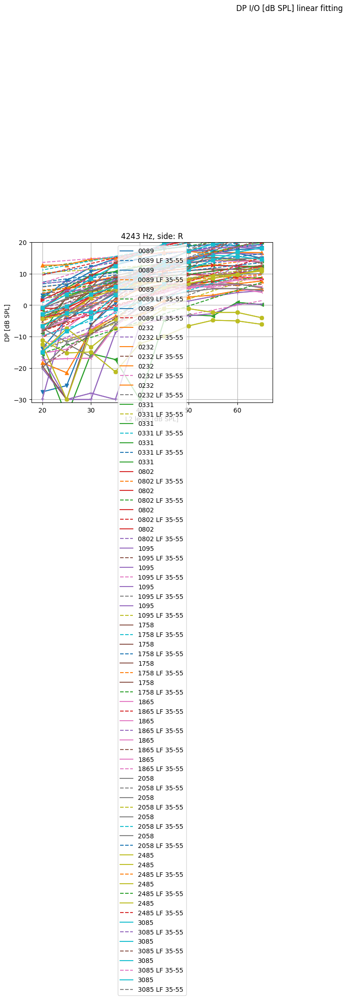

In [1]:
#%%
# =============================================================================
# DPOAE Growth Analysis Toolkit
# Author: Leny  Vinceslas (University College London)
# =============================================================================
# Comprehensive distortion-product workflow that ingests DP and GR CSV exports
# from Otodynamics Echoport 292 with ILOv6 (or any dataset sharing the same
# headers: Freq (Hz), F1/F2 (dB), DP/Noise estimates, 2F2-F1 and related bands).
# The pipeline scans Participants_170725, groups files by participant/ear/f0,
# filters high-SNR L2 pairs, toggles between dB and Pascal, and runs multiple
# fittings: linear (35-55 dB), cubic & quadratic derivatives, and PWLF segments
# anchored at 25 dB with knees at 45/50/55 dB. It computes slopes, intercepts,
# quadratic minima, PWLF slopes/R^2, and summary metrics, writes them to
# `_OaeIO_allIDFitParams.xlsx`, and exports DP I/O figures in dB and Pascal.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pwlf
import re
import os
from datetime import datetime
from collections import defaultdict
current_date = datetime.now().strftime('%d%m%y')


def dB2Pa(dB):
    Paref=0.00002
    return 10**(dB/20)*Paref

def Pa2dB(Pa):
    Paref=0.00002
    return 20*np.log10(Pa/Paref)

def nrmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())/len(targets)

def find_quadratic_minimum_in_interval(a, b, c, interval):
    # Calculate the x-coordinate of the vertex
    x_vertex = -b / (2 * a)

    # Check if the vertex is within the interval
    if interval[0] < x_vertex < interval[1]:
        # Evaluate the function at the vertex
        y_vertex = a * x_vertex**2 + b * x_vertex + c
    else:
        # If the vertex is not in the interval, set y_vertex to infinity
        y_vertex = float('inf')

    # Evaluate the function at the endpoints of the interval
    y_start = a * interval[0]**2 + b * interval[0] + c
    y_end = a * interval[1]**2 + b * interval[1] + c

    # Find the minimum value within the interval
    y_minimum = min(y_start, y_end, y_vertex)

    # Determine the corresponding x value
    if y_minimum == y_vertex:
        x_minimum = x_vertex
    elif y_minimum == y_start:
        x_minimum = interval[0]
    else:
        x_minimum = interval[1]

    # Check if the minimum value is negative
    if y_minimum < 0:
        # Find the last x where y >= 0
        x_values = np.linspace(interval[0], interval[1], 1000)
        y_values = a * x_values**2 + b * x_values + c

        # Find the indices where y >= 0
        valid_indices = np.where(y_values >= 0)[0]

        if valid_indices.size > 0:
            # Get the last valid index
            last_valid_index = valid_indices[-1]
            x_minimum = x_values[last_valid_index]
            y_minimum = y_values[last_valid_index]
        else:
            # If no y >= 0, return the interval start with its value
            x_minimum = interval[0]
            y_minimum = y_start

    return x_minimum, y_minimum

def find_cubic_slope(a, b, c, d, x1, x2):
    """
    Calculate the slope of a cubic function between two points and return the coordinates and slope.

    Parameters:
    a, b, c, d: Coefficients of the cubic function (ax^3 + bx^2 + cx + d)
    x1, x2: The points between which to calculate the slope

    Returns:
    ([x1, y1], [x2, y2], slope): The coordinates and the slope of the cubic function between x1 and x2
    """
    # Evaluate the cubic function at x1 and x2
    y1 = a * x1**3 + b * x1**2 + c * x1 + d
    y2 = a * x2**3 + b * x2**2 + c * x2 + d

    # Calculate the slope
    slope = (y2 - y1) / (x2 - x1)

    return [x1, x2], [y1, y2], slope

def average_quadratic_minimum(a, b, c, interval):
    """
    Computes the average minimum of the quadratic function y = ax^2 + bx + c
    in a specified interval within the range of x = minimum ± 3dB.
    
    Parameters:
    a, b, c (np.float64): Coefficients of the quadratic function.
    interval (list): The interval [x_start, x_end] within which to compute the average minimum.

    Returns:
    avg_x (float): The average x value within the range.
    avg_y (float): The average y value within the range.
    """
    # Ensure the coefficients are np.float64 for precision
    a = np.float64(a)
    b = np.float64(b)
    c = np.float64(c)
    
    # Calculate the x-coordinate of the vertex (minimum for quadratic)
    x_vertex = -b / (2 * a)
    
    # Evaluate the function at the vertex to get the minimum y value
    y_vertex = a * x_vertex**2 + b * x_vertex + c
    
    # 3 dB corresponds to a 2x factor, so we calculate the y value at ±3 dB from the vertex
    y_3dB = y_vertex + 3  # +3 dB for the upper bound
    
    # Define the quadratic function
    def quadratic(x):
        return a * x**2 + b * x + c
    
    # Solve for the x values where the quadratic function is within ±3 dB of the minimum
    coeffs_3dB = [a, b, c - y_3dB]  # a*x^2 + b*x + (c - y_3dB) = 0
    roots = np.roots(coeffs_3dB)
    
    # Ensure we consider only real roots (discard complex roots)
    real_roots = roots[np.isreal(roots)].real
    
    if real_roots.size == 0:
        # If there are no real roots, return the vertex as the minimum
        return x_vertex, y_vertex
    
    # Determine the range of x values where the quadratic function is within the 3 dB range
    x_min_range = np.linspace(real_roots[0], real_roots[1], 1000)
    
    # Compute the corresponding y values
    y_range = quadratic(x_min_range)
    
    # Compute the average of x and y in the 3 dB range
    avg_x = np.mean(x_min_range)
    avg_y = np.mean(y_range)
    
    return avg_x, avg_y

#%% Find all OAE files ---------------------------------------------
directory_path = os.getcwd()+'\\'
extension = ".csv"
name_pattern = re.compile(r'^((\d{4})_(DP|GR)_\w+\.csv)$')

matched_files = []
IDs=[]

directory_path =os.path.dirname(os.getcwd())+"\\Participants_170725\\"
extension = ".csv"
for root, _, files in os.walk(directory_path):
    for file in files:
        if file.endswith(extension) and name_pattern.match( file):
            matched_files.append(os.path.join(root, file))

ID_pattern1 = re.compile(r'\\(\d{4})_\w+\.csv$')


# List to store extracted IDs

# Iterate over file paths
for matched_file in matched_files:
    match = ID_pattern1.search( matched_file)
    if match:
        ID = match.group(1)
        if ID not in IDs:
            IDs.append(ID)

participantIDs=IDs
# Print the extracted IDs
print("IDs in the list:")
print(IDs)



#%% read dpGram data -------------------------------------------
# read dpGram data -------------------------------------------
OAEs=[]
for ID in participantIDs:
    DP_data=[]
    GR_data=[]
    OAEs.append({})
    OAEs[-1]['ID']=ID
    
    for file in matched_files:
        if re.search(rf'{ID}_\w+\.csv' , os.path.basename(file)):
            match1=re.match(r'(\d{4})_(\w{2})_(\w+)\.csv' , os.path.basename(file))
            if match1.group(2)=='DP':
                # data=pd.read_csv(file)  
                df = pd.DataFrame(pd.read_csv(file))
                data={}
                data['ID']=ID
                data['side']=match1.group(3)
                data['f']=df['Freq (Hz)']
                data['f1']=df['F1 (dB)']
                data['f2']=df['F2 (dB)']	
                data['dp']=df['DP (dB)']	
                data['noise2']=df['Noise+2sd (dB)']	
                data['noise1']=df['Noise+1sd (dB)']
                data['f22_1']=df['2F2-F1 (dB)']
                data['f31_22']=df['3F1-2F2 (dB)']	
                data['f32_21']=df['3F2-2F1 (dB)']	
                data['f41_32']=df['4F1-3F2 (dB)']
                data['pdsnr']=df['DP (dB)']-df['Noise+1sd (dB)']
            
                DP_data.append(data)
                
            if match1.group(2)=='GR':
                df = pd.DataFrame(pd.read_csv(file))
                data={}
                data['ID']=ID
                match2=re.match(r'(\d{4})_(\w{2})_(\w{1})_(\w+)\.csv' , os.path.basename(file))
                data['side']=match2.group(3)
                if df['Freq (Hz)'][0]>4200 and df['Freq (Hz)'][0]<4300: df['Freq (Hz)']=4243
                if df['Freq (Hz)'][0]>1400 and df['Freq (Hz)'][0]<1500: df['Freq (Hz)']=1414
                data['f']=df['Freq (Hz)']
                data['f1']=df['F1 (dB)']
                # data['f2']=df['F2 (dB)']	
                #---- forcing the values of L2 as it seems that the sofware is not returning the correct ones
                data['f2']=[65,60,55,50,45,40,35,30,25,20]
                data['dp']=df['DP (dB)']	
                data['noise2']=df['Noise+2sd (dB)']	
                data['noise1']=df['Noise+1sd (dB)']
                data['f22_1']=df['2F2-F1 (dB)']
                data['f31_22']=df['3F1-2F2 (dB)']	
                data['f32_21']=df['3F2-2F1 (dB)']	
                data['f41_32']=df['4F1-3F2 (dB)']
                data['pdsnr']=df['DP (dB)']-df['Noise+1sd (dB)']
                
                GR_data.append(data)
                
    OAEs[-1]['GR']=GR_data
    OAEs[-1]['DP']=DP_data  
 


#%% normalise frequencies and find duplicates -----------------------------------------


def normalize_f0(f0):
    """Map frequencies near 1414 or 4243 to those exact values."""
    f0 = float(f0)
    if abs(f0 - 1414) < 1000:
        return 1414
    elif abs(f0 - 4243) < 1000:
        return 4243
    else:
        return round(f0)

def find_gr_duplicates(OAEs):

    duplicate_log = []

    for oae in OAEs:
        ID = oae.get('ID', 'Unknown')
        seen = defaultdict(list)

        for idx, gr in enumerate(oae.get('GR', [])):
            side = gr.get('side')
            f = gr.get('f', [])

            # FIX: safely skip if side is missing or f is empty
            if side is None or len(f) == 0:
                continue

            # Use first 3 normalised frequencies as a signature
            try:
                f_signature = tuple(normalize_f0(x) for x in f[:3])
                key = (side, f_signature)
                seen[key].append(idx)
            except Exception as e:
                print(f"Skipping GR at index {idx} of ID {ID} due to error: {e}")
                continue

        for key, indices in seen.items():
            if len(indices) > 1:
                duplicate_log.append({
                    'ID': ID,
                    'side': key[0],
                    'f_signature': key[1],
                    'indices': indices
                })

    return duplicate_log

duplicates = find_gr_duplicates(OAEs)

for entry in duplicates:
    print(f"ID: {entry['ID']}, side: {entry['side']}, indices: {entry['indices']}, f_signature: {entry['f_signature']}")


def clean_gr_duplicates(OAEs):
    for oae in OAEs:
        ID = oae.get('ID', 'Unknown')
        gr_entries = oae.get('GR', [])
        seen = defaultdict(list)

        # Build keys and group indices
        for idx, gr in enumerate(gr_entries):
            side = gr.get('side')
            f = gr.get('f', [])
            if side is None or len(f) == 0:
                continue
            try:
                # 🔁 Normalise and overwrite full f vector
                normalised_f = [normalize_f0(x) for x in f]
                gr['f'] = normalised_f  # Overwrite original f with normalised version

                # Use first 3 values for duplicate signature
                f_signature = tuple(normalised_f[:3])
                key = (side, f_signature)
                seen[key].append(idx)
            except Exception as e:
                print(f"Skipping GR at index {idx} of ID {ID} due to error: {e}")
                continue

        # Go through duplicates and retain only highest avg dp
        to_keep = set()
        for key, indices in seen.items():
            if len(indices) == 1:
                to_keep.add(indices[0])
            else:
                best_idx = None
                best_avg_dp = float('-inf')

                for i in indices:
                    dp_vals = gr_entries[i].get('dp', [])
                    if len(dp_vals) == 0:
                        avg_dp = float('-inf')
                    else:
                        avg_dp = sum(dp_vals) / len(dp_vals)
                    if avg_dp > best_avg_dp:
                        best_avg_dp = avg_dp
                        best_idx = i

                to_keep.add(best_idx)

        # Filter and keep only best entries
        oae['GR'] = [gr for i, gr in enumerate(gr_entries) if i in to_keep]

    return OAEs


cleaned_OAEs = clean_gr_duplicates(OAEs)

OAEs=cleaned_OAEs


# %%Plot DPGRAM -----------------------------------------
# Plot DPGRAM -----------------------------------------


colors=plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.insert(1,colors[3]) 
for OAE in OAEs:
    plt.figure(figsize=((15/2)*len(OAE['DP']), 5))
    for ii, DP in enumerate(OAE['DP']):

        ylim=[-25,25]
        ax = plt.subplot(1, len(OAE['DP']), ii + 1)
        ax.plot(DP['f'], DP['dp'],'o-',color=colors[ii],label='DP')
        ax.fill_between(DP['f'], DP['noise2'],ylim[0], color='gray', alpha=0.3)
        ax.plot(DP['f'], DP['noise1'],':',label='Noise 1sd')
        ax.plot(DP['f'], DP['noise2'],':',label='Noise 2sd')
        ax.set_xscale('log')
        ax.set_title(' Side: '+DP['side'])
        ax.set_xlabel('Frequency [kHz]')
        ax.set_ylabel('DP level [dB SPL]')
        ax.grid(True, which="both")
        ax.set_xticks(np.array([1, 2, 3, 4,5,6,7,8])*1000)
        ax.set_xticklabels(['1', '2', '3', '4','5','6','7','8'])
        ax.set_ylim(ylim[0], ylim[1])
        plt.suptitle('DPOAE, ID: '+DP['ID'])
        plt.legend()
        
    


#%% ---------------------------get rid of data under noise trheshold and save in filtered-----------------------------
#get rid of data under noise trheshold and save in filtered-----------------------------

for OAE in OAEs:
    for ii, GR in enumerate(OAE['GR']):
        # Filter the arrays to keep pairs where dp > noise + 3dB
        filtered_pairs = [(f, d) for f, n, d in zip(GR['f2'], GR['noise2'], GR['dp']) if d > n + 3]
        # Unpack the filtered pairs into separate arrays
        if filtered_pairs:
            filtered_f2, filtered_dp = zip(*filtered_pairs)
        else:
            filtered_f2=GR['f2']
            filtered_dp=[-40]*len(filtered_f2)
        # Convert the filtered arrays back to numpy arrays
        GR['filt_f2'] = np.array(filtered_f2)
        GR['filt_dp'] = np.array(filtered_dp)

        filtered_pairs_35_55 = [(f, d) for f, d in zip(GR['filt_f2'], GR['filt_dp']) if 35 < f < 55]
        if filtered_pairs_35_55:
            filtered_f2_35_55, filtered_dp_35_55 = zip(*filtered_pairs_35_55)
        else:
            filtered_f2_35_55=GR['filt_f2']
            filtered_dp_35_55=[-40]*len(filtered_f2_35_55)
 
        # Convert the filtered arrays back to numpy arrays
        GR['filt_f2_35_55'] = np.array(filtered_f2_35_55)
        GR['filt_dp_35_55'] = np.array(filtered_dp_35_55)
        
        # filter from 30 to 60dB
        filtered_pairs_30_60 = [(f, d) for f, d in zip(GR['filt_f2'], GR['filt_dp']) if 20 < f < 50]
        if filtered_pairs_30_60:
            filtered_f2_30_60, filtered_dp_30_60 = zip(*filtered_pairs_30_60)
        else:
            filtered_f2_30_60=GR['filt_f2']
            filtered_dp_30_60=[-40]*len(filtered_f2_30_60)
 
        # Convert the filtered arrays back to numpy arrays
        GR['filt_f2_30_60'] = np.array(filtered_f2_30_60)
        GR['filt_dp_30_60'] = np.array(filtered_dp_30_60)



#%% Compute fittings --------------------------------- 
# Compute fittings --------------------------------- 



# create linear fitting between 35 and 45 ------- create new filtered data with only data between 35 and 45

# look at guinan and backus paper about DPgrowth function for fitting 
# OAEuPa=slope(l2-L2interscept)
# Pref = 20 microPascals
# es_DP80=20 log (SLOPE(80-L2Intercept)/Pref)

# look what's happening for: 
# 0331 4243 R
all_r2={}
upper_knees=[45,50,55]
for upper_knee in upper_knees:
    all_r2['25-'+str(upper_knee)]=[]
# df_list_cubicSlope=[]
df_list_parameters=[]
for OAE in OAEs:
    for ii, GR in enumerate(OAE['GR']):

        # Linear fit 35-55
        if len(GR['filt_f2_35_55']) > 2:
            linearFit = np.polyfit(GR['filt_f2_35_55'], GR['filt_dp_35_55'], 1)
            GR['Params_LFx35_55']=linearFit
            linearFitObj=np.poly1d(linearFit)
            GR['Fit_LFx35_55']=[GR['f2'],linearFitObj(GR['f2'])]
            
            # Cubic fit 
            cubic=np.polyfit(GR['f2'], GR['dp'], 3)
            cubicFitObj=np.poly1d(cubic)
            GR['cubicFit']=[GR['f2'],cubicFitObj(GR['f2'])]

            # filtered Cubic fit 
            cubic=np.polyfit(GR['filt_f2'], GR['filt_dp'], 3)
            cubicFitObj=np.poly1d(cubic)
            GR['cubicFitCoef']=cubicFitObj.coef
            GR['filt_cubicFit']=[GR['filt_f2'],cubicFitObj(GR['filt_f2'])]
            
            GR['cubic_slope_40-60'] =find_cubic_slope(*cubicFitObj.coeffs, 40, 60)
            
            GR['quadratic_coef']=[3*cubicFitObj.coef[0],2*cubicFitObj.coef[1],1*cubicFitObj.coef[2]]
            quadFitObj=np.poly1d(GR['quadratic_coef'])
            GR['quadFitCoef']=quadFitObj.coef
            GR['quadratic']=[GR['filt_f2'],quadFitObj(GR['filt_f2'])]
            # find minimum of the quadratic function
            GR['quadratic_min'] = find_quadratic_minimum_in_interval(*GR['quadratic_coef'],[20,80])
            # find averaged +-3 dM minimum of the quadratic function
            GR['mean3dB_quadratic_min'] = average_quadratic_minimum(*GR['quadratic_coef'],[20,80])

            
            for upper_knee in upper_knees:
                # if all(x in GR['filt_f2'] for x in [45, 50,55]):
                if len(GR['filt_f2_35_55']) > 2:
                    x0 = np.array([min(GR['f2']), 25, upper_knee, max(GR['f2'])])
                
                    # initialize piecewise linear fit with your x and y data
                    my_pwlf = pwlf.PiecewiseLinFit(GR['f2'], dB2Pa(GR['dp']))

                    # fit the data with the specified break points (ie the x locations of where
                    # the line segments should end
                    my_pwlf.fit_with_breaks(x0)
                    GR['slope_pwlfPa_25-'+str(upper_knee)]=my_pwlf.slopes
                    # predict for the determined points
                    xHat = np.linspace(min(GR['f2']), max(GR['f2']), num=100)
                    yHat = my_pwlf.predict(xHat)
                    GR['pwlfPa_25-'+str(upper_knee)]=[xHat,yHat]
                    # pwlf_error=nrmse(my_pwlf.predict(xHat),dB2Pa(GR['dp']))
                    # slope_error=nrmse(m*GR['2']+b,GR['filt_dp'])
                    GR['R^2_25-'+str(upper_knee)]=my_pwlf.r_squared()
                    all_r2['25-'+str(upper_knee)].append(GR['R^2_25-'+str(upper_knee)])
                else:
                    for upper_knee in upper_knees:
                        GR['R^2_25-'+str(upper_knee)]=np.nan
                        GR['slope_pwlfPa_25-'+str(upper_knee)]=[np.nan,np.nan,np.nan]

        else: 
            GR['Params_LFx35_55']=[np.nan,np.nan]
            GR['Fit_LFx35_55']=[[np.nan],[np.nan]]
            GR['quadratic_min']=[np.nan,np.nan]
            GR['cubic_slope_40-60']=[[np.nan,np.nan],[np.nan,np.nan],np.nan]
            GR['cubicFitCoef']=[np.nan,np.nan,np.nan,np.nan]
            GR['quadFitCoef']=[np.nan,np.nan,np.nan]
            for upper_knee in upper_knees:
                GR['slope_pwlfPa_25-'+str(upper_knee)]=[np.nan,np.nan,np.nan]
                GR['R^2_25-'+str(upper_knee)]=np.nan
        df_list_parameters.append(pd.DataFrame({'ID' :  [OAE['ID']],
                                        'Freq' :  [GR['f'][0]],
                                        'ear' :  [GR['side']],
                                        'quadratic_min_x' : [ GR['quadratic_min'][0]],
                                        'quadratic_min_y' : [ GR['quadratic_min'][1]],
                                        'cubic_slope' : [float(GR['cubic_slope_40-60'][2])],
                                        'cubic_x3': [float(GR['cubicFitCoef'][0])],
                                        'cubic_x2': [float(GR['cubicFitCoef'][1])],
                                        'cubic_x': [float(GR['cubicFitCoef'][2])],
                                        'cubic_const': [float(GR['cubicFitCoef'][3])],
                                        'quadr_x2': [float(GR['quadFitCoef'][0])],
                                        'quadr_x': [float(GR['quadFitCoef'][1])],
                                        'quadr_const': [float(GR['quadFitCoef'][2])],
                                        'Slope_LFx35_55' : [float(GR['Params_LFx35_55'][0])],
                                        'Intercept_LFx35_55' : [float(GR['Params_LFx35_55'][1])],
                                        'slope1_pwlf25_45':[float(GR['slope_pwlfPa_25-45'][0])],
                                        'slope1_pwlf25_50':[float(GR['slope_pwlfPa_25-50'][0])],
                                        'slope2_pwlf25_45':[float(GR['slope_pwlfPa_25-45'][1])],
                                        'slope2_pwlf25_50':[float(GR['slope_pwlfPa_25-50'][1])],
                                        'slope3_pwlf25_45':[float(GR['slope_pwlfPa_25-45'][2])],
                                        'slope3_pwlf25_50':[float(GR['slope_pwlfPa_25-50'][2])],
                                        }))

        # piecewise fit 
        # your desired line segment end locations

            
#some additional cleaning         
         
# Targets: (ID, side, target_f)
targets = [
    ('8045', 'L', 4243),
    ('8045', 'R', 4243),
    ('4984', 'L', 1414),
    ('4984', 'R', 1414),
    ('4984', 'R', 4243),
    ('4554', 'L', 4243),
    ('3985', 'L', 4243),
]

# Define keys to clear with different nan lengths
keys_nan2 = [
    'filt_cubicFit',
    'cubic_slope_40-60',
    'pwlfPa_25-45',
    'pwlfPa_25-50',
]
keys_nan3 = [
    'slope_pwlfPa_25-45',
    'slope_pwlfPa_25-50',
]

# Loop and overwrite matching entries
for oae in OAEs:
    if oae.get('ID') not in [t[0] for t in targets]:
        continue

    for gr in oae.get('GR', []):
        side = gr.get('side')
        f = gr.get('f', [])
        if not side or len(f) == 0:
            continue

        f0 = float(f[0])  # first freq
        for target_id, target_side, target_f in targets:
            if oae['ID'] == target_id and side == target_side and abs(f0 - target_f) < 1e-3:
                for key in keys_nan2:
                    gr[key] = [np.nan, np.nan]
                for key in keys_nan3:
                    gr[key] = [np.nan, np.nan, np.nan]         

            

for upper_knee in upper_knees:
            mean_r2=np.mean(all_r2['25-'+str(upper_knee)])
            print('mean R^2 25-'+str(upper_knee)+':' + str(str(mean_r2)))

df_allIDFitParams=pd.concat(df_list_parameters,ignore_index=True)

df_allIDFitParams.to_pickle('_OaeIO_allIDFitParams.pkl')
T_df_allIDFitParams=df_allIDFitParams.T
T_df_allIDFitParams.to_excel('_OaeIO_allIDFitParams.xlsx', index=False)



#%% plot DP Growth Function ---------------------------- 
# plot DP Growth Function ----------------------------


for OAE in OAEs: #[OAEs[1]]:
# for OAE in [OAEs[14]]:
    fig, ax = plt.subplots(2, 4, figsize=(20, 6), gridspec_kw={'height_ratios': [2, 1]})
    for ii, GR in enumerate(OAE['GR']):
        if GR['side']=='L' and GR['f'][0]==1414: n_sub=0
        if GR['side']=='R' and GR['f'][0]==1414: n_sub=1
        if GR['side']=='L' and GR['f'][0]==4243: n_sub=2
        if GR['side']=='R' and GR['f'][0]==4243: n_sub=3

        # Create a 2x4 grid of subplots (2 rows and 4 columns) for 8 panels
        # fig, ax = plt.subplots(2, 4, figsize=(25, 12))

        # Plotting the main growth I/O function in the first row
        ax[0, n_sub].plot(GR['f2'], GR['dp'],'o', label='DP')
        ax[0, n_sub].fill_between(GR['f2'], GR['noise2'], -31, color='gray', alpha=0.3)
        ax[0, n_sub].plot(GR['f2'], GR['noise1'], ':', label='Noise 1sd')
        ax[0, n_sub].plot(GR['f2'], GR['noise2'], ':', label='Noise 2sd')

        try:
            ax[0, n_sub].plot(GR['filt_cubicFit'][0], GR['filt_cubicFit'][1], '--', label='Cubic fit')
            ax[0, n_sub].plot(GR['cubic_slope_40-60'][0], GR['cubic_slope_40-60'][1], 'k', label='slope_40-60')
        except Exception:
            print('missing cubic fit for ' + GR['ID'])
            
            
        
        if GR['f'][n_sub] < 2000:
            ax[0, n_sub].set_ylim(-10, 25) 
        else:
            ax[0, n_sub].set_ylim(-15, 25)
        ax[0, n_sub].set_xlim(15, 68)
        ax[0, n_sub].set_title(f'{GR["f"][0]} Hz, side: {GR["side"]}')
        ax[0, n_sub].set_xlabel('L2 level [dB SPL]')
        ax[0, n_sub].set_ylabel('DP [dB SPL]')
        ax[0, n_sub].grid(True)
        ax[0, n_sub].legend()

        # Plotting the derivative function in the second row
        ax[1, n_sub].set_title('DPOAE I/O function derivative')
        try:
            ax[1, n_sub].plot(GR['quadratic'][0], GR['quadratic'][1], '--', color='tab:purple', label='Quadratic')
            ax[1, n_sub].plot(GR['quadratic_min'][0], GR['quadratic_min'][1], '*', color='tab:brown', label='Quadratic_min')
            
        except Exception:
            print('missing quadratic fit for ' + GR['ID'])

        ax[1, n_sub].set_xlabel('L2 level [dB SPL]')
        ax[1, n_sub].set_ylabel('DP [dB SPL]')
        ax[1, n_sub].set_xlim(15, 68)
        ax[1, n_sub].grid(True)
        ax[1, n_sub].legend()

    plt.suptitle(f'DP I/O [dB]. ID: {GR["ID"]}')
    plt.tight_layout()
    plt.show()
    
#%% plot DP Growth Function In Pa---------------------------- 
# plot DP Growth Function Pa for pwlf----------------------------

subplot_positions = {
    ('L', 1414): (0, 0),
    ('R', 1414): (0, 1),
    ('L', 4243): (1, 0),
    ('R', 4243): (1, 1),
}

for OAE in OAEs:
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    for GR in OAE['GR']:
        freq_key = normalize_f0(GR['f'][0])
        position = subplot_positions.get((GR['side'], freq_key))
        if position is None:
            continue
        
        try:
            l2_levels = np.asarray(GR['f2'], dtype=float)
            dp_pa = dB2Pa(np.asarray(GR['dp'], dtype=float))
            noise1_pa = dB2Pa(np.asarray(GR['noise1'], dtype=float))
            noise2_pa = dB2Pa(np.asarray(GR['noise2'], dtype=float))
        except (TypeError, ValueError, KeyError):
            continue

        if not (l2_levels.size and dp_pa.size and noise1_pa.size and noise2_pa.size):
            continue
        if not (len(l2_levels) == len(dp_pa) == len(noise1_pa) == len(noise2_pa)):
            continue
        
        ax = axes[position]
        ax.plot(l2_levels, dp_pa, 'o-', label='DP')
        ax.plot(l2_levels, noise1_pa, ':', label='Noise 1sd')
        ax.plot(l2_levels, noise2_pa, ':', label='Noise 2sd')
        shaded_floor = np.minimum(noise1_pa, dp_pa)
        ax.fill_between(l2_levels, noise2_pa, shaded_floor, color='gray', alpha=0.3)
        
        for knee in (45, 50, 55):
            fit = GR.get(f'pwlfPa_25-{knee}')
            if isinstance(fit, (list, tuple)) and len(fit) == 2:
                fit_x, fit_y = fit
                try:
                    fit_x = np.atleast_1d(np.asarray(fit_x, dtype=float))
                    fit_y = np.atleast_1d(np.asarray(fit_y, dtype=float))
                except (TypeError, ValueError):
                    continue
                if fit_x.size and fit_y.size and len(fit_x) == len(fit_y) and np.any(np.isfinite(fit_y)):
                    ax.plot(fit_x, fit_y, '--', label=f'PWLF 25-{knee}')
        
        finite_vals = np.concatenate([dp_pa, noise1_pa, noise2_pa])
        finite_vals = finite_vals[np.isfinite(finite_vals)]
        y_max = finite_vals.max() if finite_vals.size else 2e-4
        ax.set_xlim(15, 70)
        ax.set_ylim(-0.05 * y_max, y_max * 1.1 if y_max > 0 else 2e-4)
        ax.set_title(f"{int(freq_key)} Hz, side: {GR['side']}")
        ax.set_xlabel('L2 level [dB SPL]')
        ax.set_ylabel('DP [Pa]')
        ax.grid(True)
        ax.legend()
    
    for axis in axes.flat:
        if not axis.has_data():
            axis.axis('off')
    
    fig.suptitle(f"DP I/O [Pa]. ID:{OAE['ID']}")
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    fig.savefig(os.path.join('Figures', f"{OAE['ID']}_growth_Pa.svg"), format='svg')
    plt.show()

#%% plot DP Growth Function same figure---------------------------- 
#plot DP Growth Function same figure---------------------------- 

colors=plt.rcParams['axes.prop_cycle'].by_key()['color']
# markers = [".",",","o","v","^","<",">","1","2","3","4","8","s","p","P","*","h","H","+","x","X","D","d","|","_"]
markers = ["v","^","<",">","1","2","3","4","8","s","p","P","*","h","H","+","x","X","D","d","|","_",".",",","o",]

plt.figure(figsize=(15, 10))
for cc, OAE in enumerate(OAEs):
    
    
    for ii, GR in enumerate(OAE['GR']):
        
        if GR['side']=='L' and GR['f'][0]==1416: n_sub=1
        if GR['side']=='R' and GR['f'][0]==1416: n_sub=2
        if GR['side']=='L' and GR['f'][0]==4248: n_sub=3
        if GR['side']=='R' and GR['f'][0]==4248: n_sub=4
        
        ax = plt.subplot(2, 2, n_sub)
        ax.plot(GR['f2'], GR['dp'],'-',color=colors[cc],label=GR['ID'])
        ax.plot(GR['f2'], GR['dp'],marker=markers[cc],color=colors[cc])
        # Plot linear fit if available (Fit_LFx35_55 is populated earlier)
        fit_x, fit_y = GR.get('Fit_LFx35_55', ([], []))
        if len(fit_x) and not np.all(np.isnan(fit_y)):
            ax.plot(fit_x, fit_y, '--', label=f'{GR["ID"]} LF 35-55')
        # ax.plot(GR['f2'], dB2Pa(GR['noise1']),':',label='Noise 1sd')
        # ax.plot(GR['f2'], dB2Pa(GR['noise2']),':',label='Noise 2sd')
        # ax.fill_between(GR['f2'], dB2Pa(min([min(GR['noise1']),min(GR['dp'])])), dB2Pa(GR['noise2']), color='gray', alpha=0.3)
        # ax.plot(GR['f2'], (GR['slope'][0]*
        #          GR['f2']+GR['slope'][1])*10**6,'--',label= 'ID: '+GR['ID']+' slope: '+ format(GR['slope'][0]*10**6,'.2f'))
        # ax.set_xlim(xmin, xmax)
        if GR['f'][0] < 2000:
            ax.set_ylim(-31, 20) 
        else:
            ax.set_ylim(-31, 20)
        ax.set_title(str(GR['f'][0])+ ' Hz, side: '+GR['side'])
        ax.set_xlabel('L2 level [dB SPL]')
        ax.set_ylabel('DP [dB SPL]')
        ax.grid(True)
        ax.legend()
    plt.suptitle(' DP I/O [dB SPL] linear fitting')
    # plt.show()


plt.figure(figsize=(15, 10))
for cc, OAE in enumerate(OAEs):
    
    
    for ii, GR in enumerate(OAE['GR']):
        
        if GR['side']=='L' and GR['f'][0]==1416: n_sub=1
        if GR['side']=='R' and GR['f'][0]==1416: n_sub=2
        if GR['side']=='L' and GR['f'][0]==4248: n_sub=3
        if GR['side']=='R' and GR['f'][0]==4248: n_sub=4
        
        ax = plt.subplot(2, 2, n_sub)
        ax.plot(GR['filt_f2'], dB2Pa(GR['filt_dp'])*10**6,'o',color=colors[cc],marker=markers[cc])
        # ax.plot(GR['f2'], dB2Pa(GR['noise1']),':',label='Noise 1sd')
        # ax.plot(GR['f2'], dB2Pa(GR['noise2']),':',label='Noise 2sd')
        # ax.fill_between(GR['f2'], dB2Pa(min([min(GR['noise1']),min(GR['dp'])])), dB2Pa(GR['noise2']), color='gray', alpha=0.3)
        # Use same linear fit in Pascals if available
        fit_x_pa, fit_y_db = GR.get('Fit_LFx35_55', ([], []))
        if len(fit_x_pa) and not np.all(np.isnan(fit_y_db)):
            ax.plot(fit_x_pa, dB2Pa(fit_y_db)*10**6,'--',color=colors[cc],label= GR['ID']+' LF 35-55')
        # ax.set_xlim(xmin, xmax)
        if GR['f'][0] < 2000:
            ax.set_ylim(-.5*1, 20*10) 
        else:
            ax.set_ylim(-.5*1, 20*10) 
        ax.set_title(str(GR['f'][0])+ ' Hz, side: '+GR['side'])
        ax.set_xlabel('L2 level [dB SPL]')
        ax.set_ylabel('DP [µPa]')
        ax.grid(True)
        ax.legend()
    plt.suptitle(' DP I/O [µPa] linear fitting')
    # plt.savefig('Figures//'+GR['ID']+"_growth_Pa.svg", format="svg")
    # plt.show()


    
